# Minecraft Motion Action Dataset

[Датасет](https://huggingface.co/datasets/CraftJarvis/minecraft-motion-action-dataset)

In [2]:
from datasets import load_dataset

ds = load_dataset('CraftJarvis/minecraft-motion-action-dataset', split="valid", streaming=True)
print(ds.features) 
row = next(iter(ds))


README.md:   0%|          | 0.00/981 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/218 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/218 [00:00<?, ?it/s]

{'id': Value('string'), 'label': List(Value('string')), 'image': List({'image_path': Value('string'), 'resolution': List(Value('int64'))}), 'conversations': List({'role': Value('string'), 'content': List({'type': Value('string'), 'text': Value('string')})}), 'image_bytes': List(Value('binary'))}


In [3]:
for key in row:
    print(key, ":", "type ", ": ", type(row[key]))

id : type  :  <class 'str'>
label : type  :  <class 'list'>
image : type  :  <class 'list'>
conversations : type  :  <class 'list'>
image_bytes : type  :  <class 'list'>


Датасет в формате как [vla sft](https://github.com/EHAT32/AdapterRL/blob/main/explore_datasets/explore_minecraft_vla.ipynb) и [text action](https://github.com/EHAT32/AdapterRL/blob/main/explore_datasets/explore_text_action.ipynb)

In [4]:
label = row['label']
print(label)

['motion_action']


## Изображения

30


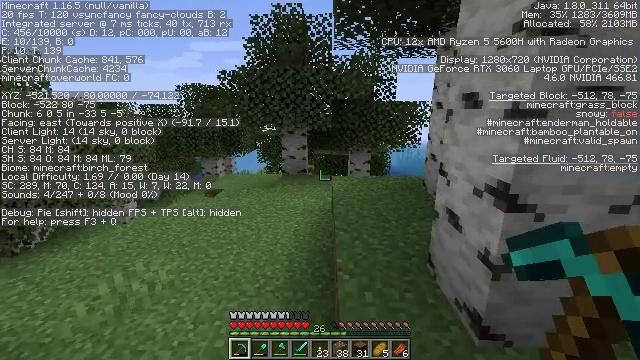

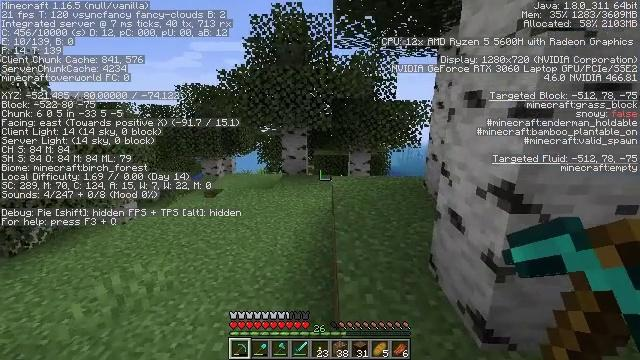

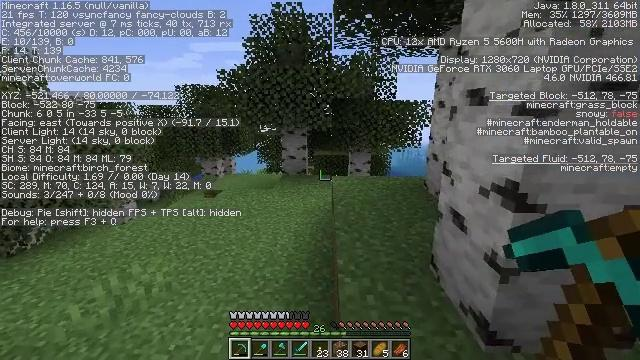

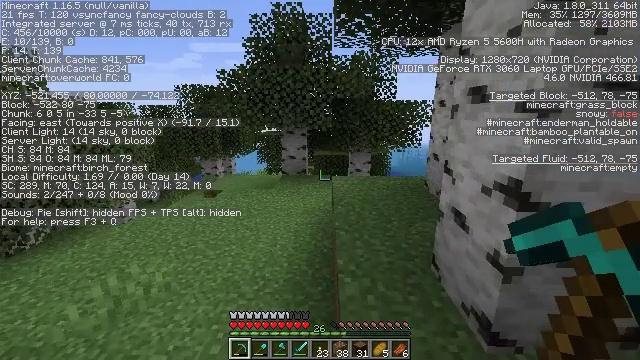

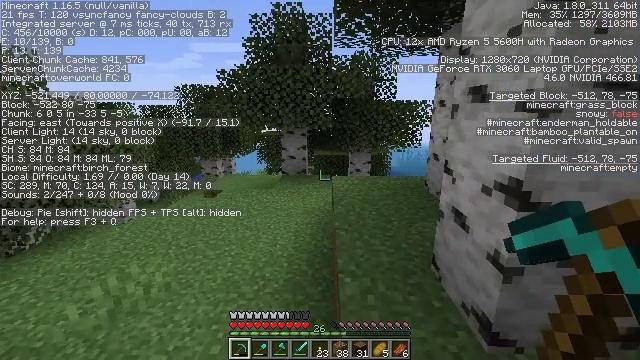

...

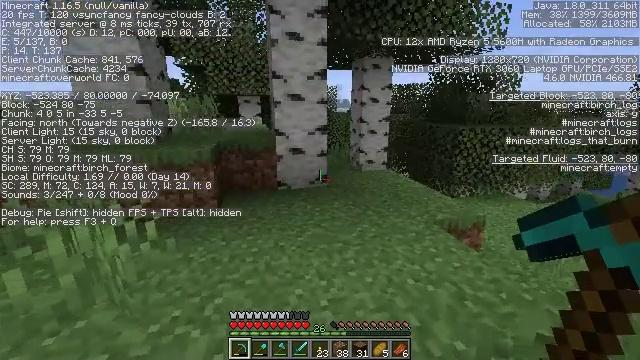

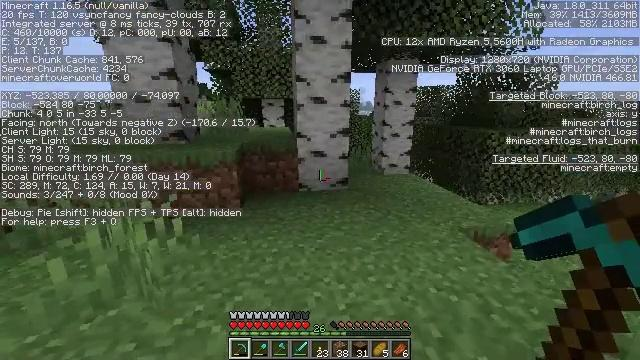

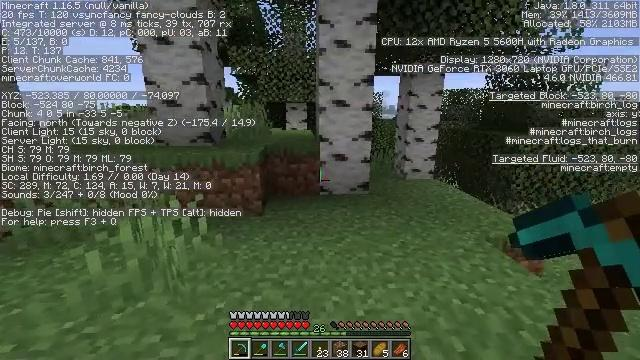

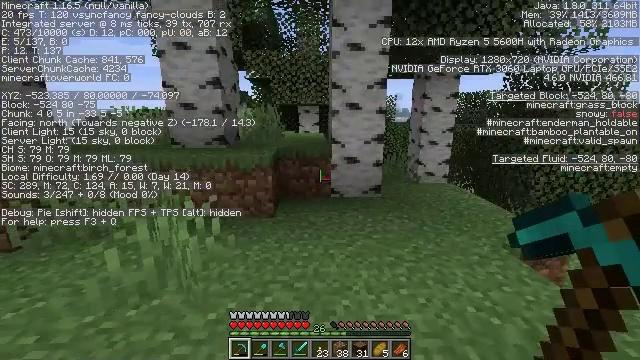

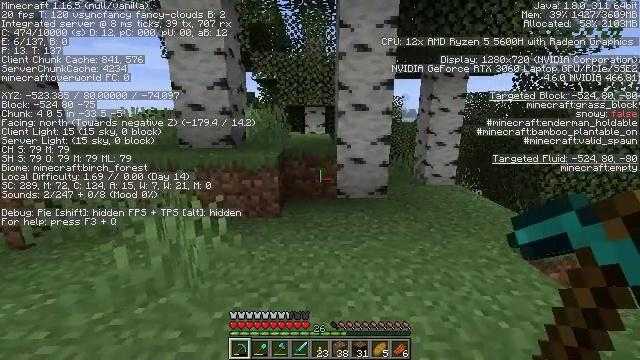

In [5]:
from PIL import Image
from io import BytesIO
image_bytes = row['image_bytes']
print(len(image_bytes))
for bytes in image_bytes:
    img = Image.open(BytesIO(bytes))
    img.show()

Имеются довольно длинные эпизоды

## Диалоги

In [6]:
import json

conversations = row["conversations"]

print(json.dumps(conversations, indent=2, ensure_ascii=False))


[
  {
    "role": "user",
    "content": [
      {
        "type": "text",
        "text": "You are an AI agent performing tasks in Minecraft based on given instructions and visual observations (screenshots). Your goal is to take the next optimal action to complete the task.\n\n## Action Space\n* move <direction> # Move in one or more of the following directions: forward, backward, right, left. You may combine directions (e.g., forward and left).\n* sprint # Sprint in the current movement direction.\n* sneak # Sneak; modifies movement in GUI and world.\n* turn <direction> # Turn the camera view. Supported directions: up, down, right, left, or combinations like left and down.\n* cursor move <direction> # Move the GUI cursor. Supported directions: up, down, right, left, or combinations like right and up.\n* jump\n* drop # Drop one item; Use Ctrl + drop to release the full stack.\n* swap # Swap items between hands.\n* switch hotbar # Switch to a different hotbar slot.\n* open inventory\n*

## Вывод

В этом датасете другой формат действий, тут нет специфики по нажатию клавиш и не совсем понятно насколько делается сдвиг. Этот датасет упоминается в [OpenHA: A Series of Open-Source Hierarchical
Agentic Models in Minecraft](https://arxiv.org/pdf/2509.13347)

Скорее всего датасет используется для более высокоуровневого планирования, чтобы агент спланировал действия высокоуровнево в естественном виде, подробности должны быть описаны в статье. 